
# Análisis de Clustering con PCA y K-Means

Este notebook muestra cómo realizar un análisis de componentes principales (PCA) para reducir la dimensionalidad de las variables categóricas y luego aplicar K-Means para agrupar los datos. También se emplea el método del codo para determinar el número óptimo de clusters y se visualizan los resultados.

## Pasos:
1. Eliminación de la columna `id`.
2. Codificación de variables categóricas con One-Hot Encoding.
3. Reducción de dimensionalidad mediante PCA.
4. Determinación del número óptimo de clusters con el método del codo.
5. Aplicación de K-Means.
6. Evaluación con el puntaje de silueta.
7. Visualización de los clusters con los componentes de PCA.


In [12]:

# Importar librerías necesarias
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Cargar el dataset
df = pd.read_csv('data_cleaned.csv')
df.drop(["duracion_llegada", "duracion_descarga"], axis=1, inplace=True)
# Mostrar las primeras filas del dataset para conocer su estructura
df.head()


,id,Turno Carga,equipo_acarreo,operador_acarreo,material,flota_carguio,equipo_carguio,duracion_acarreo,duracion_viajando_vacio,tonelaje,efh_cargado_km,efh_vacio_km,distancia_cargado_km,distancia_vacia_km,velocidad_cargado,velocidad_vacio
0,1104116,A,Equipo_acarreo 1,Operador 1,Mineral Sulfuro,Flota_carguio 1,Equipo_carguio 1,120,124.2,305.0,1.00,1.24,0.66,0.61,20.22,18.24
1,1104117,A,Equipo_acarreo 2,Operador 2,Mineral Óxido,Flota_carguio 2,Equipo_carguio 2,338,271.8,275.0,2.82,2.72,2.23,2.30,23.71,26.32
2,1104119,A,Equipo_acarreo 4,Operador 4,Desmonte,Flota_carguio 1,Equipo_carguio 4,216,448.2,273.0,1.80,4.48,1.28,3.28,20.51,25.73
3,1104120,A,Equipo_acarreo 5,Operador 5,Mineral Óxido,Flota_carguio 2,Equipo_carguio 2,340,394.8,298.0,2.83,3.95,2.25,2.30,23.95,29.35
4,1104124,A,Equipo_acarreo 9,Operador 9,Desmonte,Flota_carguio 1,Equipo_carguio 6,204,340.2,282.0,1.70,3.40,1.44,1.39,24.85,33.03



### Carga de los datos

En esta celda, se cargan los datos y se visualizan las primeras filas para entender las variables disponibles. La columna `id` se eliminará porque no es relevante para el análisis.


In [13]:

# Eliminar la columna 'id'
df = df.drop('id', axis=1)

# Seleccionar las columnas categóricas
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns


Index(['Turno Carga', 'equipo_acarreo', 'operador_acarreo', 'material',
       'flota_carguio', 'equipo_carguio'],
      dtype='object')


### Eliminación de la columna `id` y selección de variables categóricas

Aquí eliminamos la columna `id` que no es relevante para el análisis. Luego seleccionamos las columnas categóricas que se utilizarán para aplicar el PCA.


In [14]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
import pandas as pd

# Aplicar One-Hot Encoding a las columnas categóricas
encoder = OneHotEncoder(sparse_output=False)
categorical_encoded = encoder.fit_transform(df[categorical_columns])

# Escalar los datos categóricos codificados
scaler = StandardScaler()
categorical_scaled = scaler.fit_transform(categorical_encoded)

# Aplicar PCA a las variables categóricas codificadas y escaladas
pca = PCA(n_components=2)
pca_result = pca.fit_transform(categorical_scaled)

# Crear un DataFrame con los componentes principales del PCA
pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])

# Seleccionar columnas numéricas
numeric_columns = df.select_dtypes(include=['number']).columns

# Escalar las columnas numéricas
numeric_scaled = scaler.fit_transform(df[numeric_columns])

# Crear un DataFrame con las columnas numéricas escaladas
numeric_df = pd.DataFrame(numeric_scaled, columns=numeric_columns)

# Unir las columnas numéricas escaladas con los componentes del PCA
df_combined = pd.concat([numeric_df.reset_index(drop=True), pca_df], axis=1)

# Mostrar las primeras filas del nuevo DataFrame combinado
df_combined.head()


,duracion_acarreo,duracion_viajando_vacio,tonelaje,efh_cargado_km,efh_vacio_km,distancia_cargado_km,distancia_vacia_km,velocidad_cargado,velocidad_vacio,PCA1,PCA2
0,-1.435707,-1.574984,2.188706,-1.447842,-1.576195,-2.025531,-2.113117,-0.105091,-2.895570,3.493723,-0.746615
1,-0.699492,-0.681709,-1.036581,-0.698898,-0.680503,-0.490726,-0.464615,0.462994,-0.864641,-0.281428,-1.457793
2,-1.111502,0.385864,-1.251600,-1.118636,0.384643,-1.419430,0.491321,-0.057886,-1.012939,2.436701,-0.382086
3,-0.692738,0.062687,1.436139,-0.694783,0.063889,-0.471174,-0.464615,0.502060,-0.103043,-0.339332,-0.599889
4,-1.152028,-0.267752,-0.284014,-1.159787,-0.268970,-1.263016,-1.352270,0.648557,0.821934,2.523225,-0.204886



### Codificación y reducción de dimensionalidad con PCA

Se aplica One-Hot Encoding para transformar las variables categóricas en una representación numérica. Luego se utiliza PCA para reducir la dimensionalidad a 2 componentes principales, facilitando la visualización y el análisis posterior.


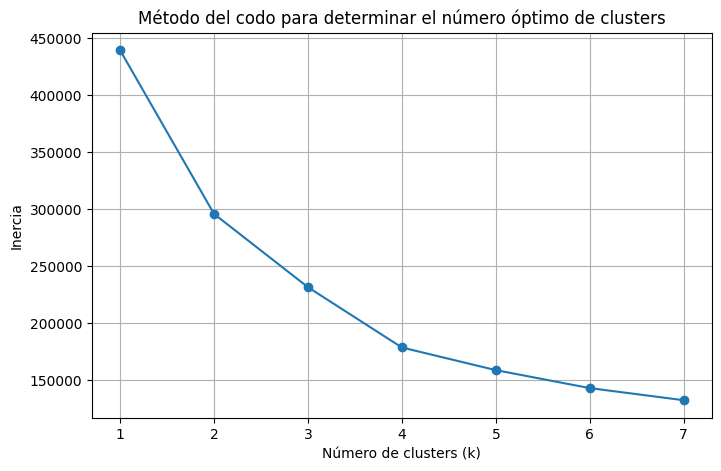

In [15]:

# Método del codo para determinar el número óptimo de clusters
k_range = range(1, 8)
inertia = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
    kmeans.fit(df_combined)
    inertia.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Método del codo para determinar el número óptimo de clusters')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.grid(True)
plt.show()



### Método del codo

Se utiliza el método del codo para determinar el número óptimo de clusters. En este método, se grafica la inercia (suma de distancias cuadradas de los puntos al centroide más cercano) frente al número de clusters. El punto donde la inercia deja de disminuir significativamente sugiere el número óptimo de clusters.


In [16]:

# Ejecutar K-Means con el número óptimo de clusters (ajustar según el gráfico del codo)
optimal_clusters = 4  # Ajustar de acuerdo con el resultado del método del codo
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10, max_iter=300)
df_combined['Cluster'] = kmeans.fit_predict(df_combined)

# Calcular el puntaje de silueta para evaluar la calidad de los clusters
score = silhouette_score(df_combined, df_combined['Cluster'])
print(f'Puntaje de silueta: {score}')


Puntaje de silueta: 0.45539304063440655



### Aplicación de K-Means y evaluación con índice de silueta

Se ejecuta el algoritmo de K-Means utilizando el número óptimo de clusters obtenido con el método del codo. Posteriormente, se calcula el índice de silueta, que mide la cohesión y separación de los clusters. Un valor cercano a 1 indica una buena separación entre clusters.


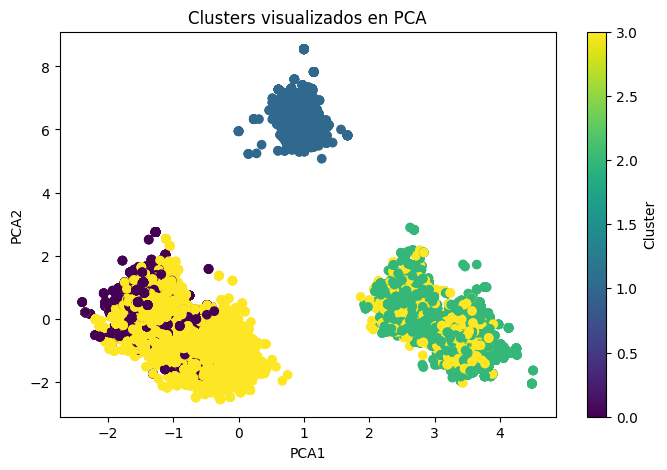

In [17]:

# Graficar los clusters en el espacio PCA
plt.figure(figsize=(8, 5))
plt.scatter(df_combined['PCA1'], df_combined['PCA2'], c=df_combined['Cluster'], cmap='viridis')
plt.title('Clusters visualizados en PCA')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar(label='Cluster')
plt.show()


In [18]:
%pip install plotly
%pip install nbformat

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



### Visualización de los clusters en el espacio PCA

Se visualizan los clusters resultantes del K-Means utilizando los componentes principales obtenidos del PCA. Cada punto representa una observación y el color indica el cluster asignado por el algoritmo.


In [21]:
import plotly.express as px

fig = px.parallel_coordinates(df_combined,
                              color="Cluster",  # Escoger la columna para el color
                              color_continuous_scale=px.colors.diverging.Tealrose)
fig.show()

In [22]:
df["Cluster"] = df_combined["Cluster"]
df

,Turno Carga,equipo_acarreo,operador_acarreo,material,flota_carguio,equipo_carguio,duracion_acarreo,duracion_viajando_vacio,tonelaje,efh_cargado_km,efh_vacio_km,distancia_cargado_km,distancia_vacia_km,velocidad_cargado,velocidad_vacio,Cluster
0,A,Equipo_acarreo 1,Operador 1,Mineral Sulfuro,Flota_carguio 1,Equipo_carguio 1,120,124.2,305.0,1.00,1.24,0.660000,0.61,20.220000,18.24,2
1,A,Equipo_acarreo 2,Operador 2,Mineral Óxido,Flota_carguio 2,Equipo_carguio 2,338,271.8,275.0,2.82,2.72,2.230000,2.30,23.710000,26.32,0
2,A,Equipo_acarreo 4,Operador 4,Desmonte,Flota_carguio 1,Equipo_carguio 4,216,448.2,273.0,1.80,4.48,1.280000,3.28,20.510000,25.73,2
3,A,Equipo_acarreo 5,Operador 5,Mineral Óxido,Flota_carguio 2,Equipo_carguio 2,340,394.8,298.0,2.83,3.95,2.250000,2.30,23.950000,29.35,0
4,A,Equipo_acarreo 9,Operador 9,Desmonte,Flota_carguio 1,Equipo_carguio 6,204,340.2,282.0,1.70,3.40,1.440000,1.39,24.850000,33.03,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29645,B,Equipo_acarreo 5,Operador 1,Mineral Óxido,Flota_carguio 1,Equipo_carguio 6,280,346.8,282.0,2.33,3.47,1.850000,1.36,23.400000,20.19,2
29646,B,Equipo_acarreo 7,Operador 6,Desmonte,Flota_carguio 2,Equipo_carguio 2,186,820.2,294.0,1.55,8.20,2.030000,2.83,39.150000,25.90,0
29647,B,Equipo_acarreo 13,Operador 104,Mineral Óxido,Flota_carguio 2,Equipo_carguio 3,700,816.0,272.0,5.83,8.16,3.880000,4.17,19.720000,25.19,3
29648,B,Equipo_acarreo 15,Operador 68,Desmonte,Flota_carguio 2,Equipo_carguio 2,200,832.8,282.0,1.67,8.33,2.080000,2.88,37.290000,21.89,0


In [23]:
df.groupby('Cluster').mean(numeric_only=True)

,duracion_acarreo,duracion_viajando_vacio,tonelaje,efh_cargado_km,efh_vacio_km,distancia_cargado_km,distancia_vacia_km,velocidad_cargado,velocidad_vacio
Cluster,,,,,,,,,
0,254.556933,289.223760,283.746133,2.111319,2.892220,1.953523,2.103195,28.173975,30.589483
1,295.309211,212.149342,280.443257,2.446965,2.121488,1.487361,1.458541,18.864482,26.098396
2,297.445860,305.175142,284.699088,2.449725,3.051765,1.827161,2.021550,23.616067,28.714457
3,804.420033,475.953005,285.401388,6.673009,4.759561,3.565563,3.505909,16.346173,30.044537


In [26]:
numeric_columns = df.select_dtypes(include='number').columns

mode_result = df.groupby('operador_acarreo')[numeric_columns].agg(lambda x: x.mode().iloc[0])
mode_result.sample(20)

,duracion_acarreo,duracion_viajando_vacio,tonelaje,efh_cargado_km,efh_vacio_km,distancia_cargado_km,distancia_vacia_km,velocidad_cargado,velocidad_vacio,Cluster
operador_acarreo,,,,,,,,,,
Operador 68,190,199.8,289.0,1.58,2.00,2.692938,3.29,14.20,27.29,3
Operador 111,204,199.8,283.0,1.73,2.00,1.740000,1.69,27.92,31.16,3
Operador 57,702,415.8,288.0,5.85,4.16,1.590000,1.61,16.98,30.31,3
Operador 81,194,157.8,283.0,1.62,1.58,1.430000,1.28,27.71,26.19,3
Operador 64,266,256.2,278.0,2.22,2.56,1.790000,1.91,13.15,25.82,3
Operador 93,886,385.8,282.0,7.38,3.86,3.390000,3.29,14.76,32.03,3
Operador 6,198,174.0,283.0,1.65,1.74,1.580000,1.66,15.86,31.70,3
Operador 39,796,499.8,287.0,1.73,5.00,3.510000,1.75,14.83,21.51,3
Operador 125,248,172.2,299.0,2.07,1.72,1.440000,1.30,13.35,22.96,3


In [27]:
numeric_columns = df.select_dtypes(include='number').columns

mode_result = df.groupby('equipo_acarreo')[numeric_columns].agg(lambda x: x.mode().iloc[0])
mode_result

,duracion_acarreo,duracion_viajando_vacio,tonelaje,efh_cargado_km,efh_vacio_km,distancia_cargado_km,distancia_vacia_km,velocidad_cargado,velocidad_vacio,Cluster
equipo_acarreo,,,,,,,,,,
Equipo_acarreo 1,224,202.2,291.0,1.87,2.02,3.390000,3.37,15.07,31.71,3
Equipo_acarreo 10,194,193.8,280.0,1.62,1.94,3.350000,3.37,16.82,25.99,3
Equipo_acarreo 11,738,432.0,286.0,6.28,4.32,3.440000,3.27,16.04,29.40,3
Equipo_acarreo 12,200,190.2,281.0,1.67,1.90,1.660000,1.51,16.98,31.61,3
Equipo_acarreo 13,208,192.0,286.0,1.73,1.92,1.830000,1.91,17.78,27.40,3
Equipo_acarreo 14,234,448.2,283.0,1.95,4.48,3.350000,3.24,14.11,29.85,3
Equipo_acarreo 15,184,187.8,285.0,1.53,1.88,1.760000,1.69,18.06,29.31,3
Equipo_acarreo 16,198,220.2,282.0,1.65,2.20,1.790000,1.28,15.44,31.28,3
Equipo_acarreo 17,720,187.8,281.0,1.55,1.88,3.290000,1.82,16.08,28.59,3


In [32]:
df[df['equipo_acarreo']=='Equipo_acarreo 27']['Cluster'].value_counts()

Cluster
3    633
2    208
0    200
1     59
Name: count, dtype: int64